In [1]:
# Code must be run from top down

# This is needed in vscode
%matplotlib widget

# Imports
# Needed packages: manim, numpy, pandas, matplotlib, scipy
from manim import *
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Patch
from scipy.integrate import solve_ivp
from scipy.interpolate import RegularGridInterpolator
import matplotlib.widgets as widgets
import matplotlib.style as mplstyle
import matplotlib.animation as animation

mplstyle.use('fast')
plt.style.use("seaborn-v0_8-dark-palette")


In [2]:
# Dataframe for simulation
dataFrame = pd.read_csv('mbh.csv', skiprows=2, header=0, sep=',')

# Physical Constants
LIGHT_SPEED = 3e8
GRAV_CONST = 6.67e-11
SOLAR_MASS_KG = 1.98847e30

# Program Constants
LIST_SIZE = 15; # How many black holes should be listed per page


In [5]:
# HELPER FUNCTIONS

# Returns the schwarzchild radius for a given mass (Kg)
def schwarzchildRadius(mass):
    return (2*GRAV_CONST*mass)/(LIGHT_SPEED**2)

# Returns the schwarzchild time dilation dtr/dt∞ for a given mass (Kg) and radius (m)
def schwarzchildDilation(mass, radius):
    radLimit = schwarzchildRadius(mass)
    if radius < radLimit: 
#         print(f"Given radius {radius} is less than schwarzchild radius {radLimit}!")
        return 0 
    return np.sqrt(1-(radLimit/radius))

# Returns the gravitational redshift factor (1+z)
def gravitationalRedshift(mass, radius):
    radLimit = schwarzchildRadius(mass)
    if radius < radLimit: 
#         print(f"Given radius {radius} is less than schwarzchild radius {radLimit}!")
        return 0 
    return (np.sqrt(1-(radLimit/radius)))**(-1)

# Calculate spacetime warp at point
# (x,y) is current position, (gX,gY) is mass position
# Using the gaussian approximation
def spacetimeWarp(x, y, gX, gY, mass, radius):
    radialCoord = np.sqrt((x - gX)**2 + (y - gY)**2)
    with np.errstate(divide='ignore', invalid='ignore'):
        warpFactor = np.sqrt(1 - radius / radialCoord)
    #     potential = -mass / radius
    #     potential = np.where(radius < 1e-5, np.nan, potential) 
    return warpFactor


# Convert log10(solar mass) -> kg
def solarMassToKg(mass):
    return mass * SOLAR_MASS_KG

# Convert rectangular coordinate to polar
def coordinateToRadius(x, y):
    return np.sqrt(x**2 + y**2)

# Calcualte angular velocity using rectangular position/velocity
def calculateAngularVelocity(x, y, vX, vY):
    radius = coordinateToRadius(x,y)
    if radius < 1e-10:
        return 0
    return (x*vY - y*vX) / (radius**2)

# Return geodesic velocity on the equatorial plane
# Kappa: 1=particles slower than light, 0=photons
def geodesicDerivative(x, y, vX, vY, mass,kappa=0):
    radius = coordinateToRadius(x, y)
    if radius < 1e-10:
        return 0, 0, 0, 0
    angularVelocity = calculateAngularVelocity(x, y, vX, vY)
    accelCoeff = (mass * kappa) / (radius**2) - (3 * mass * angularVelocity**2) / radius
    dx = vX
    dy = vY
    avX = x * accelCoeff
    avY = y * accelCoeff
    
    return dx, dy, avX, avY

# Convert kg to geometric units
def kgToGeometricUnit(mass):
    return GRAV_CONST * mass / LIGHT_SPEED**2
    
#With the time passed by an observers outside of the gravitational field, will return the proper time expericed by the observer inside the gravitational field
def properTime(t, mass, radius):
    T0 = t * schwarzchildDilation(mass, radius)
    return T0

#If the observer within the gravitational field were to emit an EM wave of a given wavelength, this calculates the wavelength observed outside of the gravitational field
def redshiftedWavelength(wavelengthEmit, mass, radius):
    wavelengthInf = wavelengthEmit * gravitationalRedshift(mass, radius)


In [6]:
# TIME DILATION AND GRAVITATIONAL REDSHIFT GRAPH
# Plot graph of time dilation vs distance for a given mass
# Default mass is from Mrk335 black hole
def plotTimeDilation(mass=7.2301112487166, name="Unknown Mass", minRadius=0, maxRadius=100000, sampleRate = 100):
    massKg = solarMassToKg(mass) # Convert M_BH to kg
    radii = np.linspace(minRadius, maxRadius, sampleRate)
    dilationFactors = []
    for radius in radii:
        dilationFactors.append(schwarzchildDilation(massKg, radius))
        
    # Plotting
    figure = plt.figure()
    plt.plot(radii, dilationFactors, label = "Time Dilation Factor")
    plt.axvline(x=schwarzchildRadius(massKg), color='r', linestyle='--', label='Schwarzchild Radius/Event Horizon')
    plt.title(f"Time Dilation Factor From {name} For Incremental Distances")
    plt.xlabel("Distance From Mass (m)")
    plt.ylabel("Time Dilation Factor (dtr/dt∞)")
    plt.legend()
    plt.grid()
    plt.show()
    
# Plot graph of redshift factor (1+z) vs distance for a given mass
# Default mass is from Mrk335 black hole
def plotRedshift(mass=7.2301112487166, name="Unknown Mass", minRadius=0, maxRadius=100000, sampleRate = 100):
    massKg = solarMassToKg(mass) # Convert M_BH to kg
    radii = np.linspace(minRadius, maxRadius, sampleRate)
    redshiftFactors = []
    for radius in radii:
        redshiftFactors.append(gravitationalRedshift(massKg, radius))
        
    # Plotting
    figure = plt.figure()
    plt.plot(radii, redshiftFactors, label = "Redshift Factor")
    plt.axvline(x=schwarzchildRadius(massKg), color='r', linestyle='--', label='Schwarzchild Radius/Event Horizon')
    plt.title(f"Redshift Factor (1+z) From {name} For Incremental Distances")
    plt.xlabel("Distance From Mass (m)")
    plt.ylabel("Redshift Factor (dλ∞/dλe)")
    plt.legend()
    plt.grid()
    plt.show() 
    
    
# Testing :D
# plotTimeDilation()
# plotRedshift()


In [7]:
# SPECTIME CURVATURE GRAPHS
# Aiden Tran
# Default mass is from Mrk335 black hole
spacetimeData = {
    "mass": 7.2301112487166,
    "viewRadius": 50000,
    "gridCount": 15,
    "plotGeodesic": True,
    "x0": 50000,
    "y0": 50000,
    "vX0": -0.1,
    "vY0": 0,
    "kappa": 0,
    "geoSamples": 2000,
    "geoDelta": 2000,
    "name": "Unknown Mass"
}

# Function to calculate stuff
def getSpaceCurveInfo(mass, 
                      radius, 
                      lineCount, 
                      x0=0, y0=0, 
                      vX0=0, vY0=0, 
                      kappa=0, 
                      geoSamples=1000000, 
                      geoDelta = 5,
                      calculateGeo=True
                      ):
    
    # Mass Conversions
    massKg = solarMassToKg(mass) # Convert M_BH to kg
    massGeo = kgToGeometricUnit(massKg)

    # Generate coordinates as a grid
    coordinates = np.linspace(-radius, radius, lineCount)
    X, Y = np.meshgrid(coordinates, coordinates)
    
    # Calculate warpage
    schwarzRadius = schwarzchildRadius(massKg)
    warpFactors = spacetimeWarp(X, Y, 0, 0, massKg, schwarzRadius)
    warpFactors = np.nan_to_num(warpFactors, nan=0)
    xWarped = X * warpFactors
    yWarped = Y * warpFactors

    # Calculate Geodesics
    geodesicX = 0
    geodesicY = 0
    geodesicXWarped = 0
    geodesicYWarped = 0

    if calculateGeo:
        def geodesicSystem(time, state):
            x, yPos, vX, vY = state
            dx, dy, avX, avY = geodesicDerivative(x, yPos, vX, vY, massGeo, kappa)
            return [dx, dy, avX, avY]
        
        initialState = [x0, y0, vX0, vY0]
        tTotal = (0, geoSamples * geoDelta)
        tEvaluated = np.linspace(0, geoSamples * geoDelta, geoSamples + 1)

        # Integrating geodesic derivative
        geodesicSolve = solve_ivp(geodesicSystem, tTotal, initialState, t_eval=tEvaluated, method="RK45")
        geodesicX = geodesicSolve.y[0]
        geodesicY = geodesicSolve.y[1]
        geodesicWarpFactors = spacetimeWarp(geodesicX, geodesicY, 0, 0, massKg, schwarzRadius)
        geodesicXWarped = geodesicX * geodesicWarpFactors
        geodesicYWarped = geodesicY * geodesicWarpFactors
        
    return massKg, schwarzRadius, X, Y, warpFactors, xWarped, yWarped, geodesicXWarped, geodesicYWarped


# 2D Plotting
def plotSpaceCurve2D(axis, 
                     massKg, 
                     schwarzRadius, 
                     X, Y, 
                     warpFactors, 
                     xWarped, yWarped, 
                     geodesicX, geodesicY, 
                     name, 
                     lineCount, 
                     plotGeodesic, 
                     plotType):
    # Spacetime Warp
    # Radial Graph
    if plotType == "radial":
        # Spacetime grid
        axis.plot(0, color="black", label="Spacetime Surface") # Just for the label lol
        axis.contourf(X, Y, warpFactors, levels=lineCount * 2, cmap="Greys", alpha=0.8, antialiased = False)

        # Info
        axis.set_title(f"{name} (Radial)")
    
    # Grid Graph
    elif plotType == "grid":
        axis.plot(0, color="black", label="Spacetime Surface")
        for i in range(lineCount):
            axis.plot(xWarped[i, :], yWarped[i, :], linewidth=1, color="black", alpha=0.3)
            axis.plot(xWarped[:, i], yWarped[:, i], linewidth=1, color="black", alpha=0.3)

        axis.set_title(f"{name} (Grid)")
        axis.legend(frameon=True, facecolor="white")
    
    # Geodesic Path
    if plotGeodesic:
        axis.plot(geodesicX, geodesicY, color="blue", linewidth=2, label="Geodesic Path")

    # Event Horizon
    circle = Circle((0, 0), schwarzRadius, color="red", fill=False, linestyle="--", linewidth=2, label="Event Horizon", antialiased = False)
    axis.add_patch(circle)  

    # General Graph Info
    axis.set_xlabel("X Plane (m)")
    axis.set_ylabel("Y Plane (m)")
    axis.legend()

# 3D Plotting
def plotSpaceCurve3D(axis, 
                     massKg, 
                     schwarzRadius, 
                     X, Y, 
                     warpFactors, 
                     xWarped, yWarped, 
                     geodesicX, geodesicY, 
                     name, 
                     lineCount, 
                     plotGeodesic):
    
    # Spacetime Warp
    axis.set_aspect("equal")
    axis.set_box_aspect(aspect=None, zoom=0.85)
    legends = [
        Patch(facecolor='gray', edgecolor='gray', label='Spacetime Surface')
    ]
    axis.plot_surface(X, Y, warpFactors, cmap=plt.cm.Greys, alpha=0.5, antialiased = False)
    
    # Geodesic Path
    # This was a pain to figure out
    # Still has some weird artifacts but it works well enough
    if plotGeodesic:
        interpWarp = RegularGridInterpolator((Y[:, 0], X[0, :]), warpFactors, bounds_error=False, fill_value=0)
        points = np.vstack([geodesicY, geodesicX]).T
        zGeodesic = interpWarp(points)
        axis.plot3D(geodesicX, geodesicY, zGeodesic + 0.1, color="blue", linewidth=3,
                    label="Geodesic Path", antialiased=False)
        legends.append(Patch(facecolor='blue', edgecolor='blue', label='Geodesic Path'))

    # Event Horizon
    u = np.linspace(0, 2 * np.pi, 20)
    v = np.linspace(0, np.pi, 20)
    xCircle = schwarzRadius * np.cos(u)
    yCircle = schwarzRadius * np.sin(u)
    zCircle = np.ones_like(u)
    legends.append(Patch(facecolor='red', edgecolor='red', label='Event Horizon'))
    axis.plot(xCircle, yCircle, zCircle, color = "red", antialiased = False)
    
        
    # General Graph Info
    axis.legend(handles=legends, loc='upper right')
    axis.set_zlim(0, 1)
    axis.set_xlabel("X Plane (m)")
    axis.set_ylabel("Y Plane (m)")
    axis.set_title(f"{name} (3D)")
    axis.set_zlabel(f"Spacetime Warp Factor")

# Plot everything
def plotSpaceCurveSubplots(ax1, ax2, ax3):
    # Calculations
    massKg, schwarzRadius, X, Y, warpFactors, xWarped, yWarped, geodesicX, geodesicY = getSpaceCurveInfo(
        spacetimeData["mass"],
        spacetimeData["viewRadius"],
        spacetimeData["gridCount"],
        spacetimeData["x0"],
        spacetimeData["y0"],
        spacetimeData["vX0"],
        spacetimeData["vY0"],
        spacetimeData["kappa"],
        spacetimeData["geoSamples"],
        spacetimeData["geoDelta"],
        spacetimeData["plotGeodesic"]
    )

    # Clear everything
    ax1.clear()
    ax2.clear()
    ax3.clear()

    # Plot
    plotSpaceCurve2D(ax1, massKg, schwarzRadius, X, Y, warpFactors, xWarped, yWarped, geodesicX, geodesicY, spacetimeData["name"], spacetimeData["gridCount"], spacetimeData["plotGeodesic"], "radial")
    plotSpaceCurve2D(ax2, massKg, schwarzRadius, X, Y, warpFactors, xWarped, yWarped, geodesicX, geodesicY, spacetimeData["name"], spacetimeData["gridCount"], spacetimeData["plotGeodesic"], "grid")
    plotSpaceCurve3D(ax3, massKg, schwarzRadius, X, Y, warpFactors, xWarped, yWarped, geodesicX, geodesicY, spacetimeData["name"], spacetimeData["gridCount"], spacetimeData["plotGeodesic"])

# Controls for Spacetime Graphs
# Refactoring took sooo long...
def spacetimeControls():
    # Create Plot
    figure = plt.figure(figsize=(12, 7))  # shorter height to remove empty space
    figure.suptitle("Spacetime Curvature Visualization", fontsize=24, fontweight='bold')
    ax1 = figure.add_subplot(1, 3, 1)
    ax2 = figure.add_subplot(1, 3, 2)
    ax3 = figure.add_subplot(1, 3, 3, projection='3d')
    ax1.set_aspect('equal', 'box')
    ax2.set_aspect('equal', 'box')

    figure.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.25, wspace=0.15)

    # Sliders
    axisRadius = plt.axes([0.15, 0.20, 0.7, 0.03])
    axisx0 = plt.axes([0.15, 0.15, 0.7, 0.03])
    axisy0 = plt.axes([0.15, 0.10, 0.7, 0.03])
    axisvx0 = plt.axes([0.15, 0.05, 0.7, 0.03])
    axisvy0 = plt.axes([0.15, 0.00, 0.7, 0.03])

    sliderRadius = widgets.Slider(axisRadius, "Viewing Radius (m)", 0, spacetimeData["viewRadius"]+500000,
                          valinit=spacetimeData["viewRadius"], valfmt='%d', facecolor='blue')
    sliderx0 = widgets.Slider(axisx0, "X0 (m)", 0, spacetimeData["viewRadius"],
                      valinit=spacetimeData["x0"], valfmt='%d', facecolor='green')
    slidery0 = widgets.Slider(axisy0, "Y0 (m)", 0, spacetimeData["viewRadius"],
                      valinit=spacetimeData["y0"], valfmt='%d', facecolor='green')
    slidervx0 = widgets.Slider(axisvx0, "vX0 (m/s)", -5, 5,
                       valinit=spacetimeData["vX0"], valfmt='%.2f', facecolor='red')
    slidervy0 = widgets.Slider(axisvy0, "vY0 (m/s)", -5, 5,
                       valinit=spacetimeData["vY0"], valfmt='%.2f', facecolor='red')

    # Update function
    def updatePlot(event=None):
        spacetimeData["viewRadius"] = int(sliderRadius.val)
        spacetimeData["x0"] = int(sliderx0.val)
        spacetimeData["y0"] = int(slidery0.val)
        spacetimeData["vX0"] = float(slidervx0.val)
        spacetimeData["vY0"] = float(slidervy0.val)
        plotSpaceCurveSubplots(ax1, ax2, ax3)
        figure.canvas.draw_idle()

    # Events
    sliderRadius.on_changed(lambda val: updatePlot(val)) 
    sliderx0.on_changed(lambda val: updatePlot(val)) 
    slidery0.on_changed(lambda val: updatePlot(val)) 
    slidervx0.on_changed(lambda val: updatePlot(val)) 
    slidervy0.on_changed(lambda val: updatePlot(val))

    # Initial plot
    plt.ion()
    plotSpaceCurveSubplots(ax1, ax2, ax3)
    plt.show(block=False)
    
# Testing :D
# plotSpaceCurveSubplots()
# spacetimeControls()

In [8]:


def time_comparison_animation(mass):
    plt.rcParams["animation.html"] = "jshtml"
    plt.rcParams['figure.dpi'] = 150  

    # Mrk335 
    mass_kg = solarMassToKg(mass)

    Rs = 2 * GRAV_CONST * mass_kg / LIGHT_SPEED**2

    tau_values = np.linspace(0.1, 20, 200)

    radii_values = np.linspace(20 * Rs, 1.001 * Rs, 200)

    def dilated_time(tau, r, Rs):
        factor = np.sqrt(1 - Rs / r)
        return tau / factor

    fig, ax = plt.subplots(figsize=(8,5))

    def animate(i):
        ax.cla()
        tau = tau_values[i]
        r = radii_values[i]
        dt = dilated_time(tau, r, Rs)
        
        trace_tau = tau_values[:i+1]
        trace_dt = [dilated_time(tau_values[j], radii_values[j], Rs) for j in range(i+1)]

        ax.plot(trace_tau, trace_dt, 'r:', alpha=0.6)
        ax.plot(tau, dt, 'ro')

        ax.set_xlim(0, tau_values[-1] * 1.2)
        max_dt = dilated_time(tau_values[-1], radii_values[-1], Rs) * 1.2
        ax.set_ylim(0, max_dt)
        ax.set_xlabel('Proper Time (s)')
        ax.set_ylabel('Dilated Time (s)')
        ax.set_title('Dilated Time vs Proper Time as Distance to Black Hole Decreases')
        ax.grid(True)
        ax.text(0.5, 1.07,
                f'Radius: {r/Rs:.3f} Rs  |  Proper Time: {tau:.2f} s | Dilated Time: {dt:.2f} s',
                transform=ax.transAxes, ha='center')

    ani = animation.FuncAnimation(fig, animate, frames=len(tau_values),
                                interval=100, repeat=True)
    animate(0)
    
    return ani



In [9]:
def PrintPage(page):
    firstEntry = (page - 1) * LIST_SIZE
    lastEntry = page * LIST_SIZE
    if(page > 5):
        lastEntry = len(dataFrame['Object'])
        
    print(f"Page: {page}") 
    print("------------------")
    for i in range(firstEntry, lastEntry):
        print(f'{i + 1}: {dataFrame['Object'][i]}')
        print(f'   Mass: {dataFrame['log M_BH'][i]} \n')

        
        
# Prompt users to choose a black hole to observer
awaitPageInput = True
print('View the list of black holes!\n')

while(awaitPageInput):
    page = int(input("Choose a page number (?/6):"))
    if page < 1 or page > 6:
        awaitPageInput = True
    else:
        PrintPage(page)  
        awaitPageInput = False

View the list of black holes!

Page: 1
------------------
1: Mrk335
   Mass: 7.2301112487166 

2: Mrk1501
   Mass: 8.0666340212884 

3: PG0026+129
   Mass: 8.4868203378724 

4: PG0052+251
   Mass: 8.4617279122457 

5: Fairall9
   Mass: 8.298946723557 

6: Mrk590
   Mass: 7.5697305594379 

7: Mrk1044
   Mass: NAN 

8: 1H0323+342
   Mass: NAN 

9: 3C120
   Mass: 7.7446762628144 

10: IRAS 04416+1215
   Mass: NAN 

11: H0507+164
   Mass: 6.8758704193865 

12: Ark120
   Mass: 8.0680222899781 

13: MCG+08-11-011
   Mass: 7.2875262276629 

14: Mrk6
   Mass: 8.1019355368272 

15: Mrk374
   Mass: 7.2483938995888 



In [10]:
#input the black hole you want to look at in the simulation
awaitIDInput = True
print('Choose a black hole from the list to look at!\n')
while(awaitIDInput):
    id = int(input("Choose a black hole ID (?/86):"))
    if id < 1 or id > 86:
        awaitIDInput = True
    else:
        name = dataFrame['Object'][id - 1]
        mass = float(dataFrame['log M_BH'][id - 1])
        awaitIDInput = False
print('Black Hole:',name)
print('Mass',mass)

Choose a black hole from the list to look at!

Black Hole: Mrk335
Mass 7.2301112487166


In [11]:
#input the radius you want to look at in the simulation
sRadius = schwarzchildRadius(solarMassToKg(mass))
print(f"Schwarzchild radius: {sRadius}")
radius = -1
while radius < sRadius:
    if radius > 0:
        print("Radius less than schwarszchild radius!")
    radius = float(input(f"Choose a viewing radius (m) for the simulation, must be greater than the schwarszchild radius {sRadius}:"))


Schwarzchild radius: 21309.700362063504


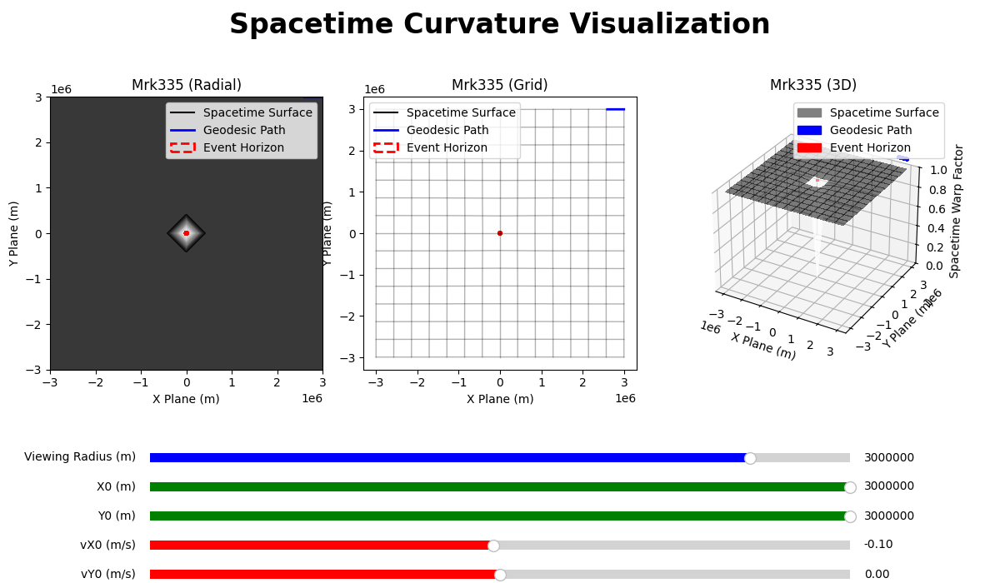

In [12]:
# Spactime visualizations
spacetimeData["mass"] = mass
spacetimeData["viewRadius"] = radius
spacetimeData["x0"] = radius
spacetimeData["y0"] = radius
spacetimeData["name"] = name
spacetimeControls()

# The sliders are a little slow because the calculations include lots of sampels and heavy integration techniques

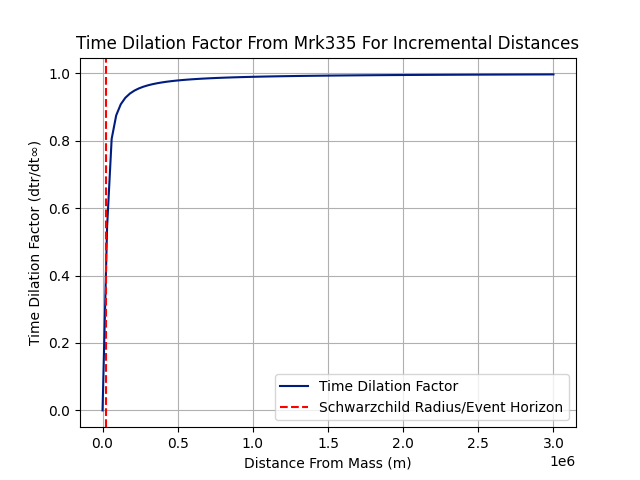

In [13]:
# Time dilation graph
plotTimeDilation(mass, name, maxRadius=radius)

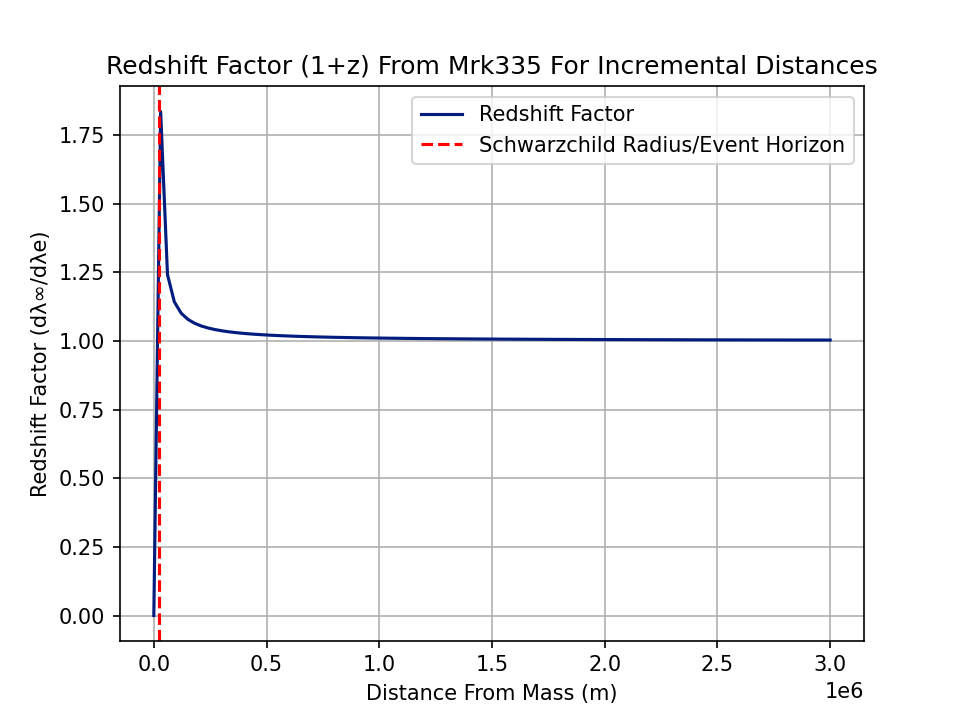

In [15]:
# Redshift graph
plotRedshift(mass, name, maxRadius=radius)

[08/14/25 12:41:52] INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>       ]8;id=293171;file://C:\Users\itsfi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\matplotlib\animation.py\animation.py]8;;\:]8;id=44505;file://C:\Users\itsfi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\matplotlib\animation.py#1076\1076]8;;\

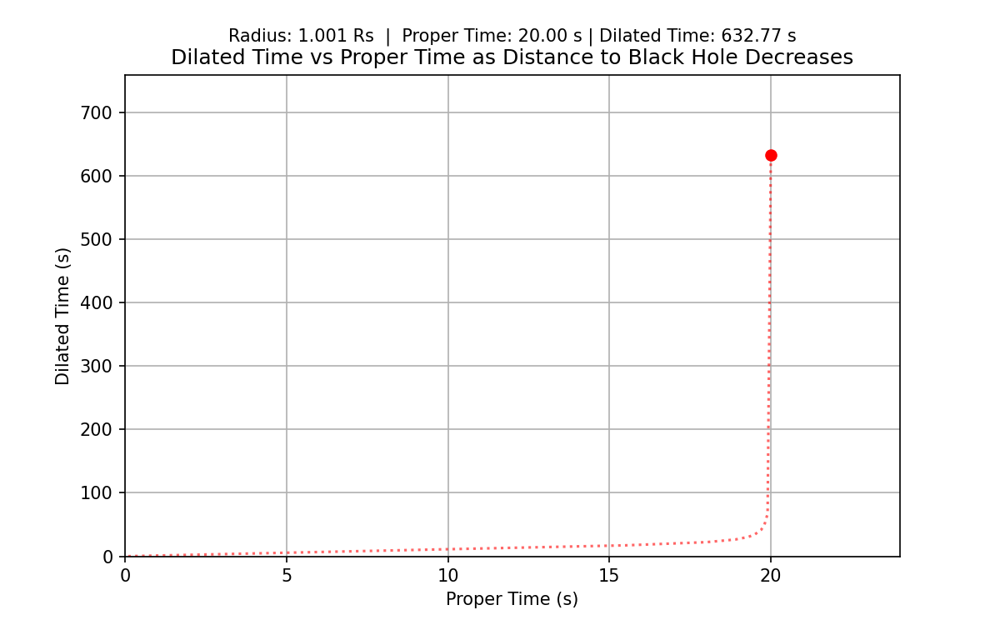

In [14]:
# Time dilation animation
time_comparison_animation(mass)

In [ ]:
# Manim animation
class TwoDWarp(Scene):
    def construct(self):
        blackhole=Dot(point=ORIGIN, color=BLACK).scale(3)
        glow=Circle(radius=0.3,color=WHITE).set_stroke(width=2)
        grid=NumberPlane(
            x_range=[-4,4,1],
            y_range=[-4,4,1],
            background_line_style={"stroke_opacity":0.4}
        )
        self.play(FadeIn(grid,glow,blackhole))
        particle=Dot(color=YELLOW).scale(0.5)
        def spiral_path(t):
            theta=8*t
            r=3*np.exp(-1.5*t)
            x=r*np.cos(theta)
            y=r*np.sin(theta)
            return np.array([x,y,0])
        path_points=[spiral_path(t) for t in np.linspace(0,2,500)]
        path_line=VMobject(color=YELLOW)
        path_line.set_points_as_corners(path_points)
        self.play(Create(path_line),run_time=2,rate_func=linear)
        self.play(MoveAlongPath(particle,path_line),run_time=4,rate_func=linear)
        self.play(particle.animate.scale(0.1).move_to(ORIGIN),run_time=0.5)
        self.wait(1)
        self.play(FadeOut(grid,blackhole,glow,particle))
class WarpedSpacetime(ThreeDScene):
    def construct(self):
        self.set_camera_orientation(phi=70*DEGREES, theta=-45*DEGREES)

        title = Text("Spacetime Warping Near a Black Hole", font_size=36).to_edge(UP)
        self.add_fixed_in_frame_mobjects(title)
        self.play(Write(title))
        self.wait(1)
        self.play(FadeOut(title))

        axes = ThreeDAxes(
            x_range=[-6, 6, 1],
            y_range=[-6, 6, 1],
            z_range=[-2, 2, 1],
            x_length=12,
            y_length=12,
            z_length=4,
            tips=False
        )
        self.play(Create(axes))

        # Constants and utility functions
        r_s = 1.0
        grid_extent = 6

        def velocity(x):
            epsilon = 1e-6
            x = max(x, epsilon)
            return max(0, 1 - r_s / x)

        def get_velocity_from_radius(r):
            return min(1.0, 1.5 * (1 - r_s / max(r, r_s + 0.01)))

        # Black hole sphere
        blackhole = Sphere(radius=r_s, color=BLACK).move_to(ORIGIN)

        # Velocity display
        r_tracker = ValueTracker(5)
        velocity_label = always_redraw(lambda:
            VGroup(
                MathTex("v_{obs} = "),
                DecimalNumber(velocity(r_tracker.get_value()), num_decimal_places=2)
            ).arrange(RIGHT).to_corner(UR).scale(0.9)
        )
        self.add_fixed_in_frame_mobjects(velocity_label)
        self.add(velocity_label)

        # Gravity well
        def height_func(u, v):
            x, y = u, v
            epsilon = 0.1
            r = np.sqrt(x**2 + y**2 + epsilon)
            z = -(r_s / r) * 2
            return np.array([x, y, z])

        gravity_well = Surface(
            height_func,
            u_range=[-grid_extent, grid_extent],
            v_range=[-grid_extent, grid_extent],
            resolution=(50, 50),
            checkerboard_colors=[BLUE_D, BLUE_E],
            fill_opacity=0.7
        )
        self.play(Create(gravity_well))

        # Particle setup
        particle_radius = 0.1 * r_s
        particle = Sphere(radius=particle_radius, color=RED)
        start_pos = height_func(5, 0)
        particle.move_to(start_pos)
        self.add(particle)

        # Path
        path = ParametricFunction(lambda t: height_func(5 - (5 - 1.1 * r_s) * t, 0), t_range=[0, 1])
        t_tracker = ValueTracker(0)
        self.add(t_tracker)
        def update_particle(mob):
            t = t_tracker.get_value()
            mob.move_to(path.point_from_proportion(t))
            r_tracker.set_value(abs(mob.get_center()[0]))

        particle.add_updater(update_particle)

        def update_t_tracker(dt):
            x = particle.get_center()[0]
            r = abs(x)
            speed = get_velocity_from_radius(r)
            new_value=min(1.0,t_tracker.get_value()+0.05*speed)
            t_tracker.set_value(new_value)
        
        t_tracker.add_updater(lambda m, dt: update_t_tracker(dt))
        self.wait(6)
        t_tracker.remove_updater(lambda m, dt: update_t_tracker(dt))
        particle.remove_updater(update_particle)
        self.wait(2)

        self.play(FadeOut(axes, gravity_well, particle, velocity_label))
        


